In [1]:
from datetime import datetime


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import json
import pickle
from tqdm.notebook import tqdm

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler 
from sklearn.cluster import (KMeans, AgglomerativeClustering, DBSCAN)

from sklearn.metrics import silhouette_score

from utils.pipeline import  get_clusters

import warnings
warnings.filterwarnings("ignore")

# Scatterplots results

In [37]:
def load_data(exp_name):
    df = pd.read_csv(f'data/data/{exp_name}/ticker_data_preprocessed.csv', index_col=0)
    df_pct = df.drop(['sector'], axis=1).T
    df_pct.index = pd.to_datetime(df_pct.index)

    emb_dict = dict()
    top_path = f"data/embeddings/{exp_name}"
    all_files = os.listdir(top_path)

    for emb_path in all_files:
        
        emb_name = emb_path.replace('.csv', '')
        emb_path = top_path + '/' + emb_path
        
        emb_dict[emb_name] = pd.read_csv(emb_path, index_col=0).values
        
    return df, df_pct, emb_dict

def draw_plot(
    features_sectors,
    df_sectors,
    features_methods,
    df_clusters,
    embeddings
):
    fig, axes = plt.subplots(int(len(features_methods)/3)+1, 3, figsize=(22, 6*int(len(features_methods)/3)))
    for i in range(len(features_methods)):
        sns.scatterplot(features_methods[i][:, 0], features_methods[i][:, 1], hue=df_clusters[i]['cluster'],  
                    palette="tab20b", legend=False, ax=axes[i//3, i%3])
        axes[i//3, i%3].set_xlabel(f'{method}_axis_1')
        axes[i//3, i%3].set_ylabel(f'{method}_axis_2')
        axes[i//3, i%3].set_title(f'Clusters from {embeddings[i]}')
        axes[i//3, i%3].grid()
    
#     plt.subplot(1, 3, 1)
#     ax = sns.scatterplot(features_sectors[:, 0], features_sectors[:, 1], hue=df_sectors,
#                         palette="tab20b", legend= False)

#     plt.xlabel('tsne_axis_1')
#     plt.ylabel('tsne_axis_2')
#     plt.title('Clusters from Economic Sectors')
#     plt.grid()

def build_embeddings(df_pct, emb_dict, embeddings, n_clusters=11, random_state=42, method='tsne'): 
    
    df_clusters = []
    features = [] 
    for emb_name in embeddings:
        embedding_data = emb_dict[emb_name]
        tickers_list = df_pct.columns.tolist()

        clust_params = {'clust_model': KMeans(n_clusters=n_clusters, random_state=random_state),
                        'make_grid':False}

        norm_emb = StandardScaler().fit_transform(embedding_data)
        df_clusters.append(get_clusters(norm_emb, tickers_list, **clust_params))
        if method == 'tsne':
            features.append(TSNE(n_components=2).fit_transform(norm_emb))
        elif method == 'pca':
            features.append(PCA(n_components=2).fit_transform(norm_emb))
        else:
            assert "You need to choose PCA or t-SNE"
    return features, df_clusters

def draw_scatter_plot(
    exp_name, 
    embeddings=['PersImage_1', 'transformer_embds1'], 
    n_clusters=11,
    method = 'tsne'
):
    df, df_pct, emb_dict = load_data(exp_name)
    
    if method == 'tsne':
        features_sectors = TSNE(n_components=2).fit_transform(df.drop(['sector'], axis=1))
    elif method == 'pca':
        features_sectors = PCA(n_components=2).fit_transform(df.drop(['sector'], axis=1))
    features_methods, df_clusters = build_embeddings(df_pct, emb_dict, embeddings, n_clusters, method=method)
    draw_plot(features_sectors, df['sector'], features_methods, df_clusters, embeddings)
   

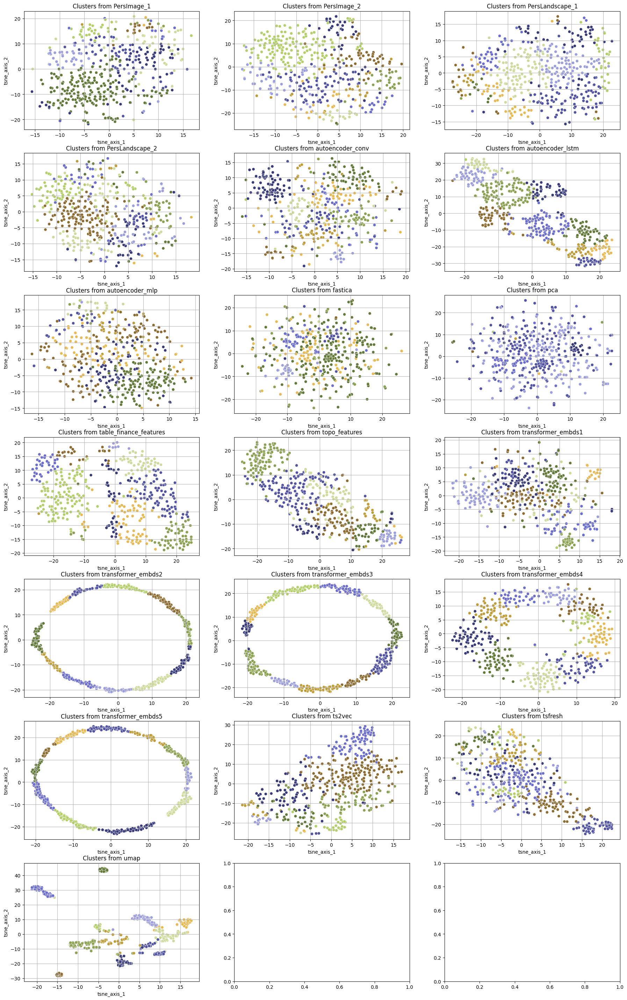

In [38]:
draw_scatter_plot('usa_2018', sorted(emb_dict.keys()))

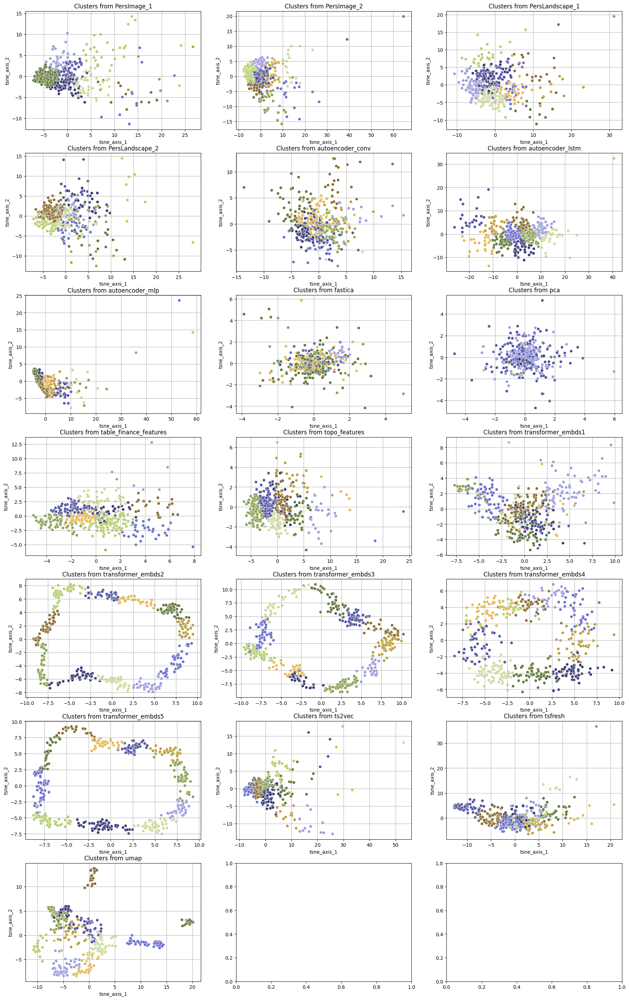

In [39]:
draw_scatter_plot('usa_2018', sorted(emb_dict.keys()), method='pca')

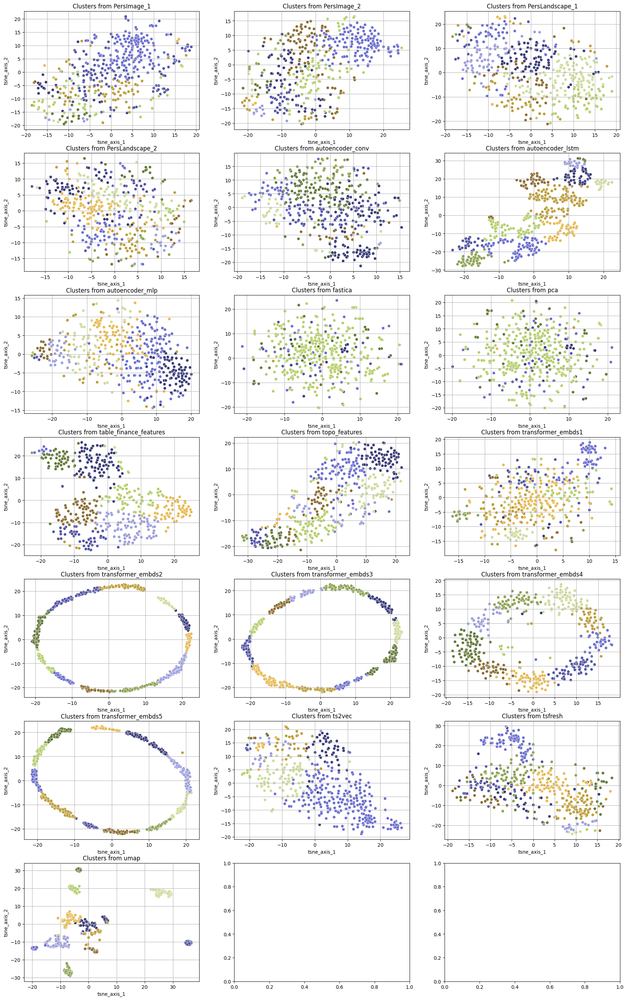

In [40]:
draw_scatter_plot('usa_2015', sorted(emb_dict.keys()))

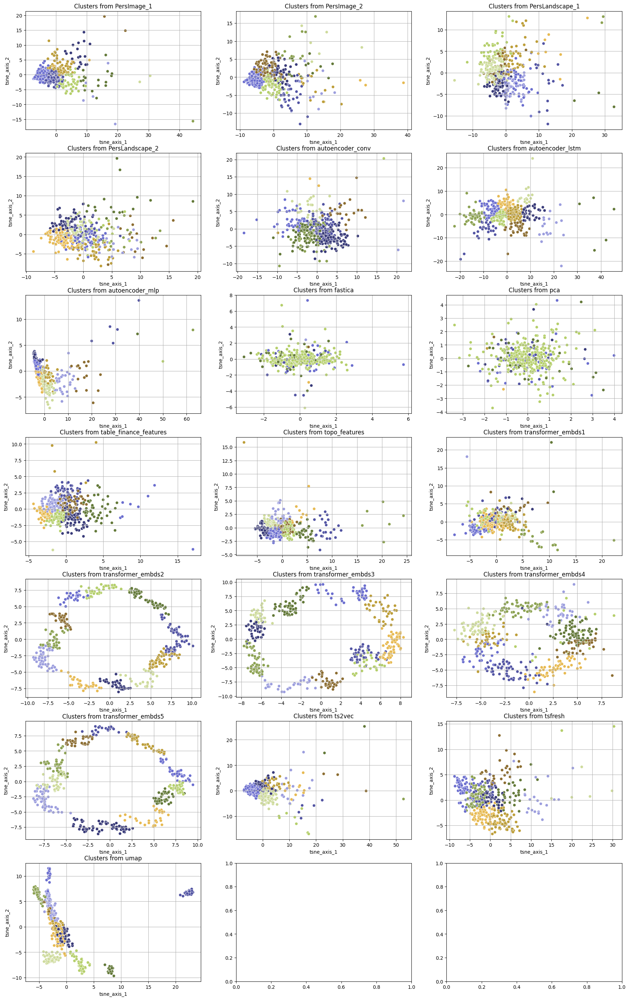

In [41]:
draw_scatter_plot('usa_2015', sorted(emb_dict.keys()), method='pca')

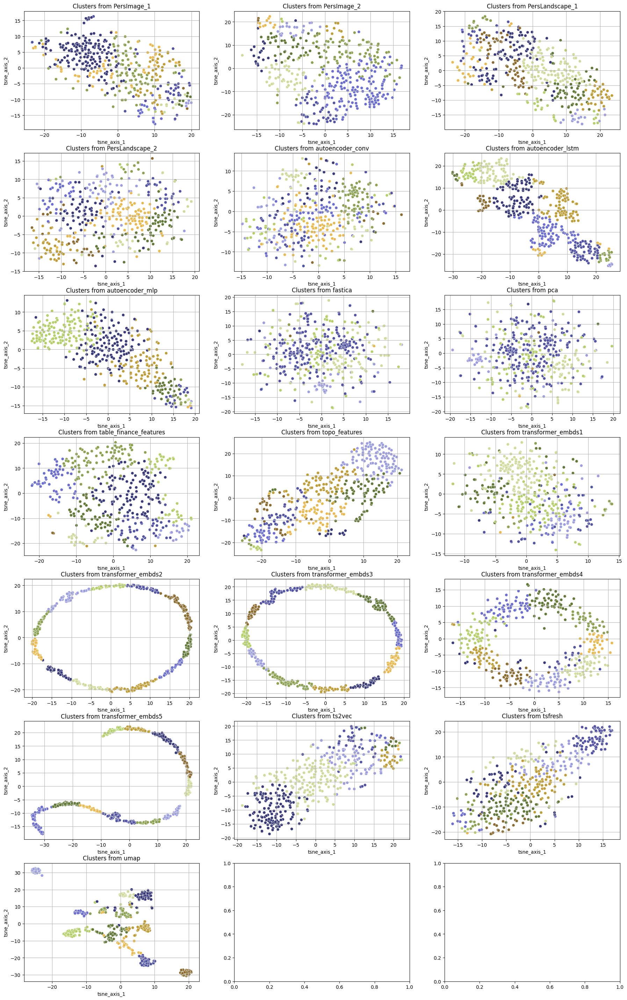

In [42]:
draw_scatter_plot('usa_2012', sorted(emb_dict.keys()))

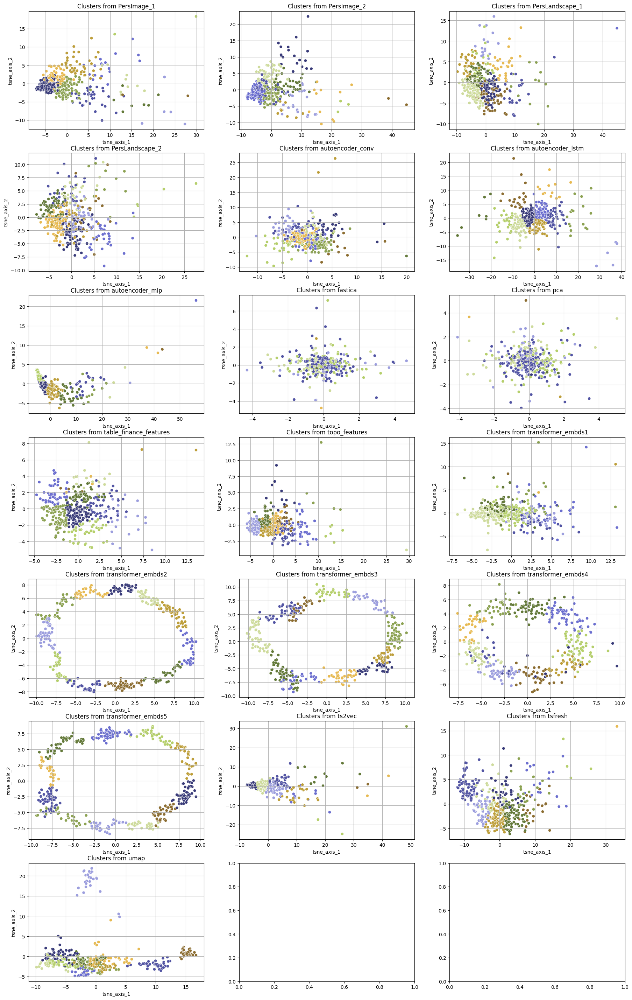

In [43]:
draw_scatter_plot('usa_2012', sorted(emb_dict.keys()), method='pca')